In [116]:
import pandas as pd 
import numpy as np 
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.ticker as plticker

import requests
import json
import time
import gmaps
import os

# Import API key
from api_keys import g_key
from api_keys import weather_api_key
gmaps.configure(api_key=g_key)

In [117]:
cleaned2 = pd.read_csv ('../Resources/Cleaned_Data.csv') 
df = cleaned2.copy()
df.head()

,Order Date,Brand,Sneaker Name,Sale Price,Retail Price,Release Date,Shoe Size,Buyer Region
0,9/1/17,Yeezy,Adidas Yeezy Boost 350 Low V2 Beluga,1097,220,9/24/16,11.0,California
1,9/1/17,Yeezy,Adidas Yeezy Boost 350 V2 Core Black Copper,685,220,11/23/16,11.0,California
2,9/1/17,Yeezy,Adidas Yeezy Boost 350 V2 Core Black Green,690,220,11/23/16,11.0,California
3,9/1/17,Yeezy,Adidas Yeezy Boost 350 V2 Core Black Red,1075,220,11/23/16,11.5,Kentucky
4,9/1/17,Yeezy,Adidas Yeezy Boost 350 V2 Core Black Red 2017,828,220,2/11/17,11.0,Rhode Island


In [118]:
df.describe()

,Sale Price,Retail Price,Shoe Size
count,99956.000000,99956.00000,99956.000000
mean,446.634719,208.61359,9.344181
std,255.982969,25.20001,2.329588
min,186.000000,130.00000,3.500000
25%,275.000000,220.00000,8.000000
50%,370.000000,220.00000,9.500000
75%,540.000000,220.00000,11.000000
max,4050.000000,250.00000,17.000000


In [119]:
df.columns

Index(['Order Date', 'Brand', 'Sneaker Name', 'Sale Price', 'Retail Price',
       'Release Date', 'Shoe Size', 'Buyer Region'],
      dtype='object')

In [120]:
df['Bought For More Than Retail Price'] = df['Sale Price']> df['Retail Price']
df.head()

,Order Date,Brand,Sneaker Name,Sale Price,Retail Price,Release Date,Shoe Size,Buyer Region,Bought For More Than Retail Price
0,9/1/17,Yeezy,Adidas Yeezy Boost 350 Low V2 Beluga,1097,220,9/24/16,11.0,California,True
1,9/1/17,Yeezy,Adidas Yeezy Boost 350 V2 Core Black Copper,685,220,11/23/16,11.0,California,True
2,9/1/17,Yeezy,Adidas Yeezy Boost 350 V2 Core Black Green,690,220,11/23/16,11.0,California,True
3,9/1/17,Yeezy,Adidas Yeezy Boost 350 V2 Core Black Red,1075,220,11/23/16,11.5,Kentucky,True
4,9/1/17,Yeezy,Adidas Yeezy Boost 350 V2 Core Black Red 2017,828,220,2/11/17,11.0,Rhode Island,True


<AxesSubplot:>

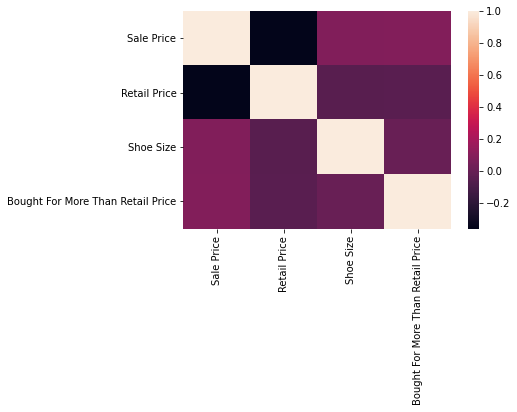

In [121]:
correlations =df.corr()
sns.heatmap(correlations)

SHAORN WORK

In [122]:
#Creating a Latitude and Longitude Column
region_group = df.groupby(["Buyer Region"])
region_count = region_group.count()
region_count = region_count.reset_index()
region_count["Lat"] = ""
region_count["Lng"] = ""
region_count = region_count[[ "Lat", "Lng", "Sale Price"]]
region_count = region_count.rename(columns={"Sale Price": "Sales Records"})

#region_count
region_mean = region_group.mean()[["Sale Price", "Retail Price", "Shoe Size"]].reset_index()

proportion = region_mean["Sale Price"] * 1000/ region_mean["Retail Price"]

region_count = pd.concat([region_mean,region_count, proportion], axis = 1)
region_count

,Buyer Region,Sale Price,Retail Price,Shoe Size,Lat,Lng,Sales Records,0
0,Alabama,395.857768,211.969365,10.067834,,,457,1867.523485
1,Alaska,435.409836,206.885246,9.524590,,,61,2104.595880
2,Arizona,449.074392,208.712446,9.790057,,,1398,2151.641648
3,Arkansas,407.861272,211.329480,10.106936,,,173,1929.978118
4,California,478.248178,206.821541,9.186056,,,19349,2312.371214
5,Colorado,434.015723,209.475891,9.676101,,,954,2071.912530
6,Connecticut,412.416216,210.783784,9.510360,,,1110,1956.584177
7,Delaware,503.335749,205.684380,8.163849,,,1242,2447.126752
8,District of Columbia,454.225092,210.221402,9.594096,,,271,2160.698613
9,Florida,445.425659,207.553325,9.685775,,,6376,2146.078165


In [123]:
#create a params dict that will be updated with new city each iteration
params = {"key": g_key}

#Loop through the region_count and get the lat/lng for each city
for index, row in region_count.iterrows():
    base_url = "https://maps.googleapis.com/maps/api/geocode/json"

    state = row['Buyer Region']

    params['address'] = state

    region_lat_lng = requests.get(base_url, params=params).json()

    region_count.loc[index, "Lat"] = region_lat_lng["results"][0]["geometry"]["location"]["lat"]
    region_count.loc[index, "Lng"] = region_lat_lng["results"][0]["geometry"]["location"]["lng"]

region_count

,Buyer Region,Sale Price,Retail Price,Shoe Size,Lat,Lng,Sales Records,0
0,Alabama,395.857768,211.969365,10.067834,32.3182,-86.9023,457,1867.523485
1,Alaska,435.409836,206.885246,9.524590,64.2008,-149.494,61,2104.595880
2,Arizona,449.074392,208.712446,9.790057,34.0489,-111.094,1398,2151.641648
3,Arkansas,407.861272,211.329480,10.106936,35.2011,-91.8318,173,1929.978118
4,California,478.248178,206.821541,9.186056,36.7783,-119.418,19349,2312.371214
5,Colorado,434.015723,209.475891,9.676101,39.5501,-105.782,954,2071.912530
6,Connecticut,412.416216,210.783784,9.510360,41.6032,-73.0877,1110,1956.584177
7,Delaware,503.335749,205.684380,8.163849,38.9108,-75.5277,1242,2447.126752
8,District of Columbia,454.225092,210.221402,9.594096,38.9072,-77.0369,271,2160.698613
9,Florida,445.425659,207.553325,9.685775,27.6648,-81.5158,6376,2146.078165


In [132]:
#Store variables for gmaps
buyer_region = region_count[["Lat", "Lng"]]
no_sales = region_count[0].astype(float)

#Create heatmap
fig = gmaps.figure(zoom_level=4, center=(37, -100))
heat_layer = gmaps.heatmap_layer(buyer_region, weights=no_sales, 
                                 dissipating=False, max_intensity=6000,
                                 point_radius=3)

fig.add_layer(heat_layer)

fig

Figure(layout=FigureLayout(height='420px'))

In [135]:
# NOTE: Do not change any of the code in this cell
#Adding the area marks to the heatmap
info_box_template = """
<dl>
<dt>State</dt><dd>{Buyer Region}</dd>
<dt>Number of Sales</dt><dd>{Sales Records}</dd>
<dt>Average Sale Price</dt><dd>{Sale Price}</dd>
<dt>Average Retail Price</dt><dd>{Retail Price}</dd>
<dt>Average Shoe Size</dt><dd>{Shoe Size}</dd>

</dl>
"""
locations = region_count[["Lat", "Lng"]]

In [136]:
region_info = [info_box_template.format(**row) for index,row in region_count.iterrows()]
marker_layer = gmaps.marker_layer(locations, info_box_content=region_info)
fig.add_layer(marker_layer)

fig

Figure(layout=FigureLayout(height='420px'))

In [137]:
df

,Order Date,Brand,Sneaker Name,Sale Price,Retail Price,Release Date,Shoe Size,Buyer Region,Bought For More Than Retail Price
0,9/1/17,Yeezy,Adidas Yeezy Boost 350 Low V2 Beluga,1097,220,9/24/16,11.0,California,True
1,9/1/17,Yeezy,Adidas Yeezy Boost 350 V2 Core Black Copper,685,220,11/23/16,11.0,California,True
2,9/1/17,Yeezy,Adidas Yeezy Boost 350 V2 Core Black Green,690,220,11/23/16,11.0,California,True
3,9/1/17,Yeezy,Adidas Yeezy Boost 350 V2 Core Black Red,1075,220,11/23/16,11.5,Kentucky,True
4,9/1/17,Yeezy,Adidas Yeezy Boost 350 V2 Core Black Red 2017,828,220,2/11/17,11.0,Rhode Island,True
...,...,...,...,...,...,...,...,...,...
99951,2/13/19,Yeezy,adidas Yeezy Boost 350 V2 Static Reflective,565,220,12/26/18,8.0,Oregon,True
99952,2/13/19,Yeezy,adidas Yeezy Boost 350 V2 Static Reflective,598,220,12/26/18,8.5,California,True
99953,2/13/19,Yeezy,adidas Yeezy Boost 350 V2 Static Reflective,605,220,12/26/18,5.5,New York,True
99954,2/13/19,Yeezy,adidas Yeezy Boost 350 V2 Static Reflective,650,220,12/26/18,11.0,California,True


In [154]:
df["Order Date"]
df['Order Date'] = pd.to_datetime(df['Order Date'])
df['day_of_week'] = df['Order Date'].dt.dayofweek

days = {0:'Monday',1:'Tuesday',2:'Wedneday',3:'Thursday',4:'Friday',5:'Saturday',6:'Sunday'}

df['day_of_week'] = df['day_of_week'].apply(lambda x: days[x])

df['day_of_week'].value_counts()



Friday      17309
Wedneday    15424
Thursday    14997
Saturday    14005
Monday      13734
Tuesday     13391
Sunday      11096
Name: day_of_week, dtype: int64

In [155]:
df["Release Date"]
df['Release Date'] = pd.to_datetime(df['Release Date'])
df['day_of_week'] = df['Release Date'].dt.dayofweek

days = {0:'Monday',1:'Tuesday',2:'Wedneday',3:'Thursday',4:'Friday',5:'Saturday',6:'Sunday'}

df['day_of_week'] = df['day_of_week'].apply(lambda x: days[x])

df['day_of_week'].value_counts()

Saturday    68827
Wedneday    12017
Friday      10755
Thursday     8287
Tuesday        70
Name: day_of_week, dtype: int64

In [165]:
difference = df["Order Date"] - df["Release Date"]
difference


0       342 days
1       282 days
2       282 days
3       282 days
4       202 days
          ...   
99951    49 days
99952    49 days
99953    49 days
99954    49 days
99955    49 days
Length: 99956, dtype: timedelta64[ns]

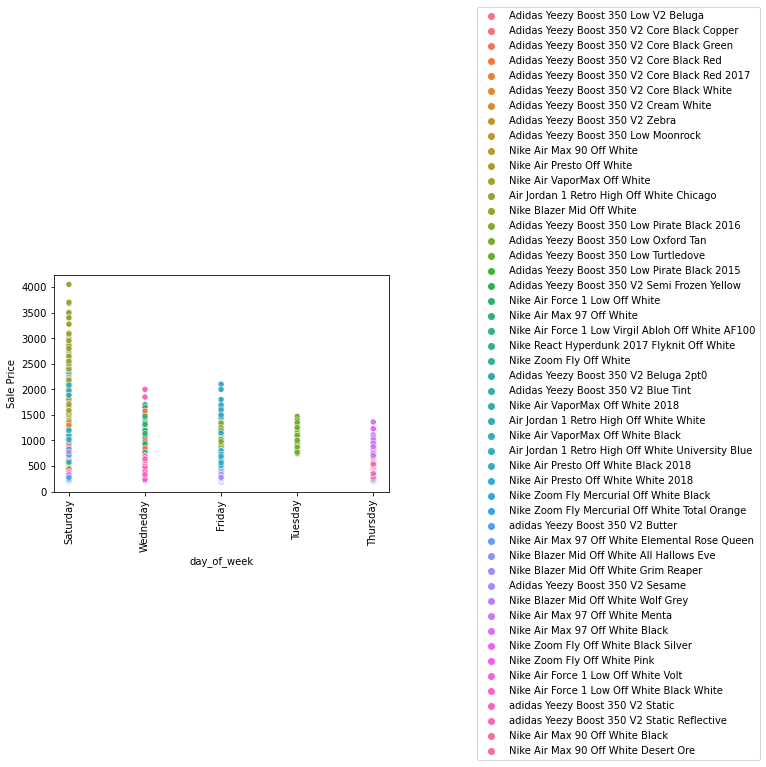

<Figure size 2160x1800 with 0 Axes>

In [167]:
#Creating a point plot of Release date vs Profit for each colorway
ys=sns.scatterplot(x="day_of_week", y="Sale Price", hue="Sneaker Name", data=df)
plt.xticks(rotation=90)
fig= plt.figure(figsize=(30,25)) 
ys.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
